In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm
import seaborn as sns
import scrublet as scr
import bbknn as bk
%matplotlib inline

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
sc.settings.set_figure_params(dpi=250,fontsize=10)

In [4]:
adata = sc.read_h5ad("/rds/general/user/snb20/home/2_Organotypic_EC_Heterogeneity/Sanger_Datasets/Resolve/Test/Test2_nolog/bin50_D2-2.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 17214 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
adata.obs['arterial_smc'] = (adata.X[:,adata.var_names=='MYH11'] > 1) & (adata.X[:,adata.var_names=='TTN'] == 0)

# Create a categorical group for multiple plotting

#### Add genes of interest to adata.obs

In [65]:
genes=["MYH11","SULF1","PDZRN4"]

In [66]:
genedf=pd.DataFrame(index=adata.obs.index)
for i in genes:
    genedf[i]=np.asarray(pd.DataFrame(adata[:, i].X))

In [67]:
genedf

,MYH11,SULF1,PDZRN4
X_Y_bins,,,
0.0_1900.0,0,0,0
0.0_1950.0,0,0,0
0.0_2150.0,0,0,0
0.0_2200.0,0,0,0
0.0_2250.0,0,0,0
...,...,...,...
9950.0_9300.0,0,0,0
9950.0_950.0,0,0,0
9950.0_9550.0,0,0,0


In [68]:
group=pd.Series("None", index=adata.obs.index)

In [69]:
gene1="MYH11"
gene2="SULF1"
gene3="PDZRN4"

group[(genedf[gene1] > 0)] = gene1
group[(genedf[gene2] > 0)] = gene2
group[(genedf[gene3]> 0)] = gene3
group[(genedf[gene1]> 0) & (genedf[gene2] > 0)] = gene1+"/"+gene2
group[(genedf[gene1] > 0) & (genedf[gene3] > 0)] = gene1+"/"+gene3
group[(genedf[gene2] > 0) & (genedf[gene3] >0)] = gene2+"/"+gene3
group[(genedf[gene1] > 0) & (genedf[gene2] > 0) & (genedf[gene3] >0)] = gene1+"/"+gene2+"/"+gene3


group.replace("None", np.nan, inplace=True) # replace 0 with nan for better plotting down the line
adata.obs["coloc"]=group


In [70]:
group

X_Y_bins
0.0_1900.0       NaN
0.0_1950.0       NaN
0.0_2150.0       NaN
0.0_2200.0       NaN
0.0_2250.0       NaN
                ... 
9950.0_9300.0    NaN
9950.0_950.0     NaN
9950.0_9550.0    NaN
9950.0_9600.0    NaN
9950.0_9650.0    NaN
Length: 17214, dtype: object

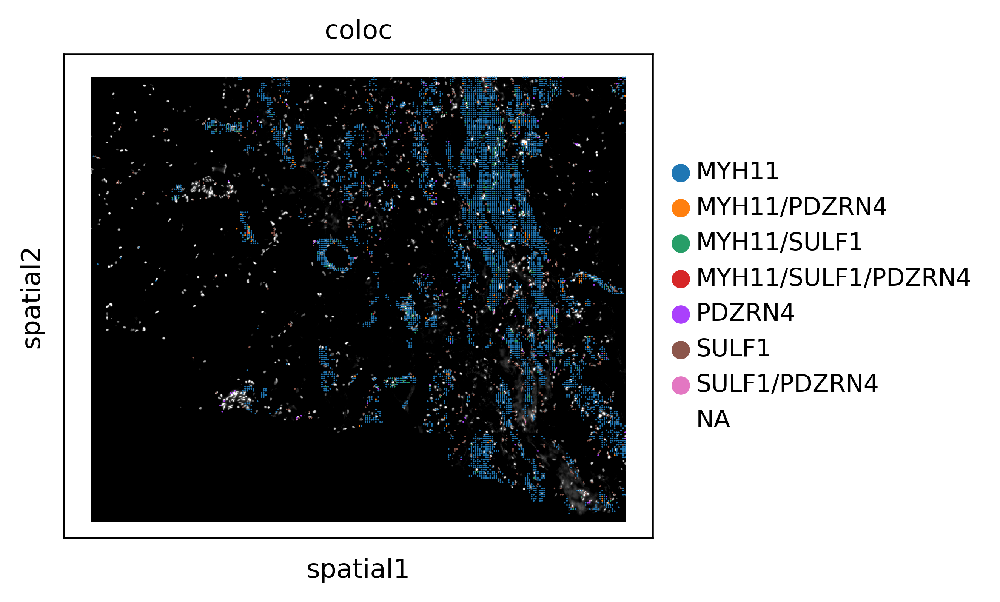

In [71]:
sc.pl.spatial(adata,color="coloc",img_key="DAPI",size=8)

In [7]:
adata_aec = adata[adata.obs['arterial_smc'] == True]

In [8]:
adata_aec

View of AnnData object with n_obs × n_vars = 541 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [9]:
data = adata_aec.obs[['X_coor','Y_coor']]
linkage_data = linkage(data, method='average', metric='euclidean')

In [10]:
temp = dendrogram(linkage_data,no_plot=True)

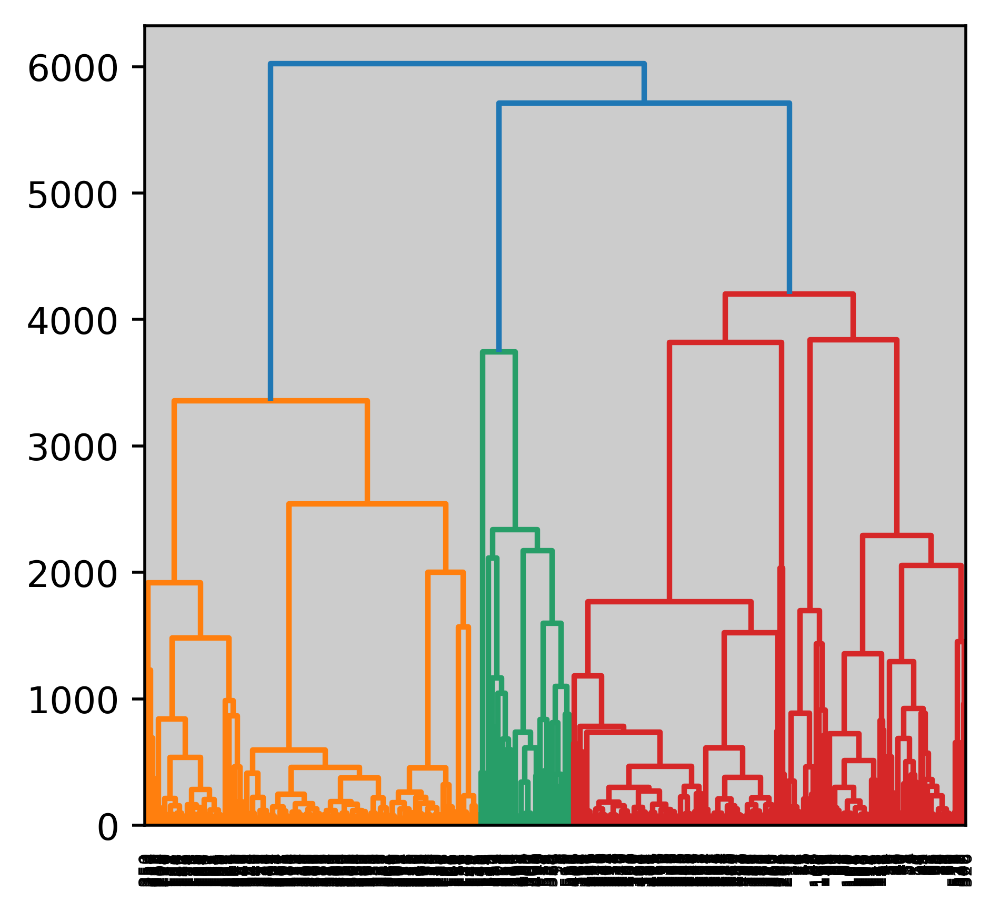

In [11]:
dendrogram(linkage_data)
plt.show()

In [12]:
adata_aec

View of AnnData object with n_obs × n_vars = 541 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [13]:
# adjust n_clusters to relevant number of vessels
hierarchical_cluster = AgglomerativeClustering(n_clusters=99, affinity='euclidean', linkage='single')

In [14]:
labels = hierarchical_cluster.fit_predict(data) 
print(labels)

[89 76 90 87  3 79 82 23 82  3  4  4 23 82  4  4 46 46 37 82  9  9 46 46
 46 46 46 37  7 28 28 46 37 43  7  7 63 43  7  7 70 43 43  8 62 73  8 32
 95 32 32 38 57 38  8  8 42  8  8 42 53  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1 91  1  1 55 74 93 86 39 39 18 18 18 18 80 18 18 18 18
 64 18 18 18 18 18 51 18 18 18 84 18 18 18 18 18 18 18 18 18 18  2 18  2
  2 18 18 18 14 14 14 14 17 17 88 15 15 15 15 15 15 15 15 15 15 15 15 15
 15  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  5  5  5 78  5  5  5 13  5  5  5 22 22 22 22 13
 22 22 22 22 22 22 22 22 22 22 22 22 22 59 52 12 12 22 22 22 22 22 22 22
 22 52 12 22 22 22 22 22 22 52 22 22 22 22 22 22 22 12 12 22 22 22 22 22
 22 97 16 16 44 21 21 10 10 10 10 10 10 72 34 34 61 31 31 45 45 45 45 45
 45 45 45 45 45 45 45 45 45 45 45 45 65 45 45 45 45 45 45 45 45 45 45 45
 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45
 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45 45

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [15]:
adata_aec.obs['SMC_clusters'] = labels
adata_aec.obs['SMC_clusters'] = adata_aec.obs['SMC_clusters'].astype('category')

/var/tmp/pbs.7751763.pbs/ipykernel_479074/1883412233.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_aec.obs['SMC_clusters'] = labels
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [16]:
adata_aec.obs['SMC_clusters'].value_counts()

45    92
11    73
22    44
26    43
5     40
      ..
67     1
68     1
35     1
70     1
49     1
Name: SMC_clusters, Length: 99, dtype: int64

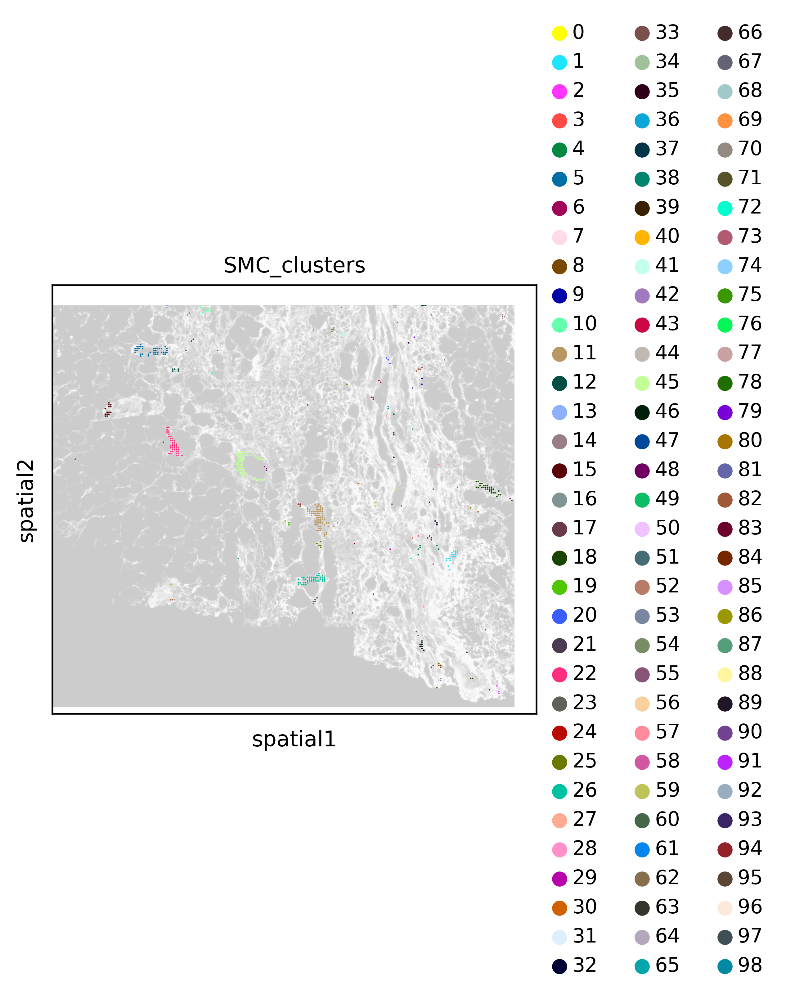

In [17]:
sc.pl.spatial(adata_aec, color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

In [18]:
# subset for clusters > 5 bins
adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist()

[45, 11, 22, 26, 5, 18, 1, 15, 46, 41, 8, 10]

In [19]:
adata_aec_subset = adata_aec[adata_aec.obs.SMC_clusters.isin(adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist())]

In [20]:
adata_aec_subset.obs.SMC_clusters = adata_aec_subset.obs.SMC_clusters.astype(str).astype('category')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/pandas/core/generic.py:5931: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value


In [21]:
adata_aec_subset

AnnData object with n_obs × n_vars = 382 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [22]:
del adata_aec_subset.uns['SMC_clusters_colors']

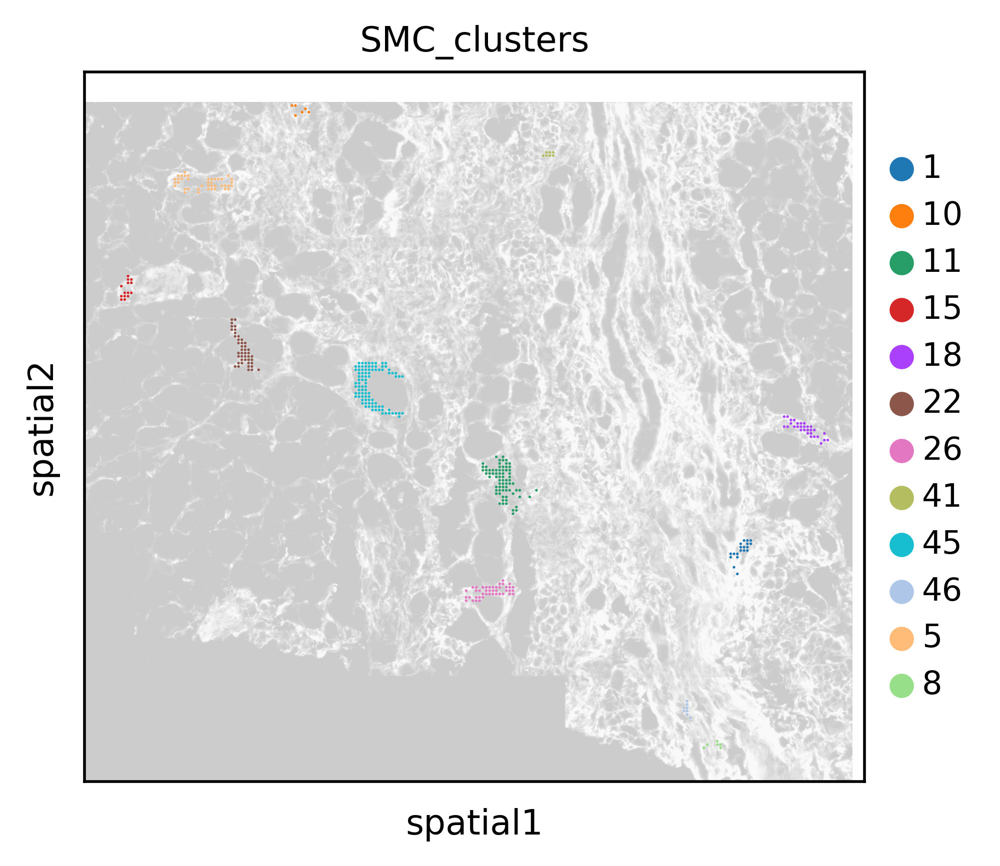

In [23]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

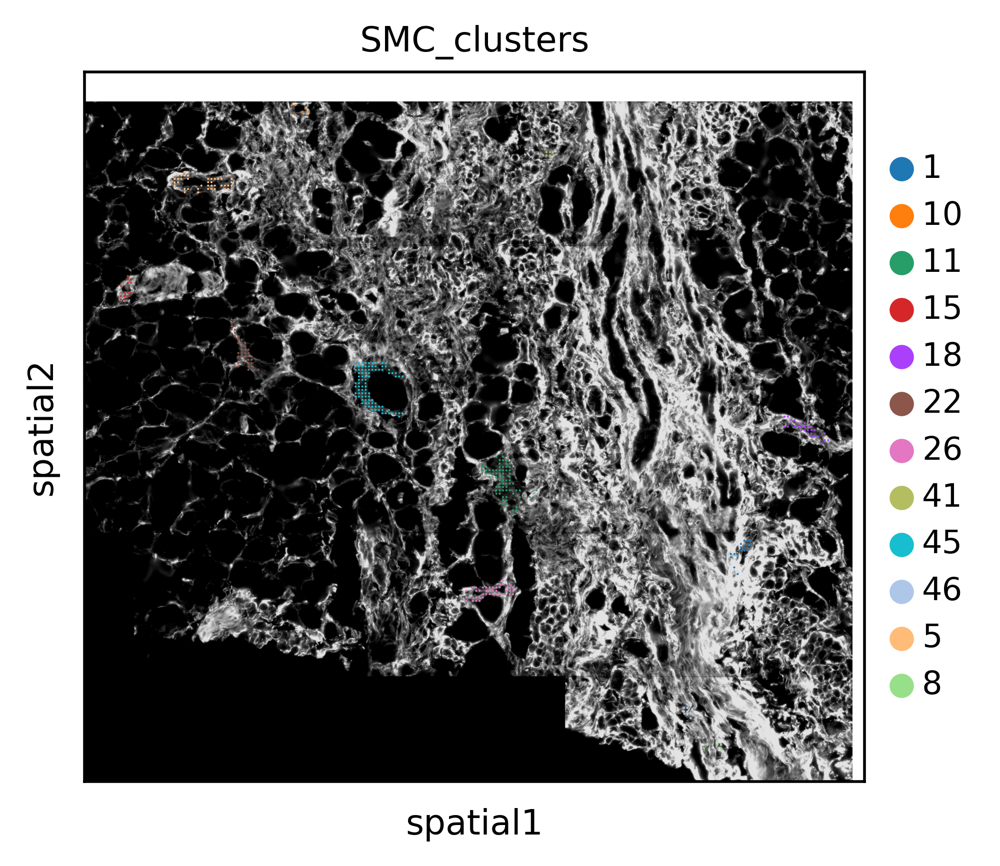

In [24]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6)

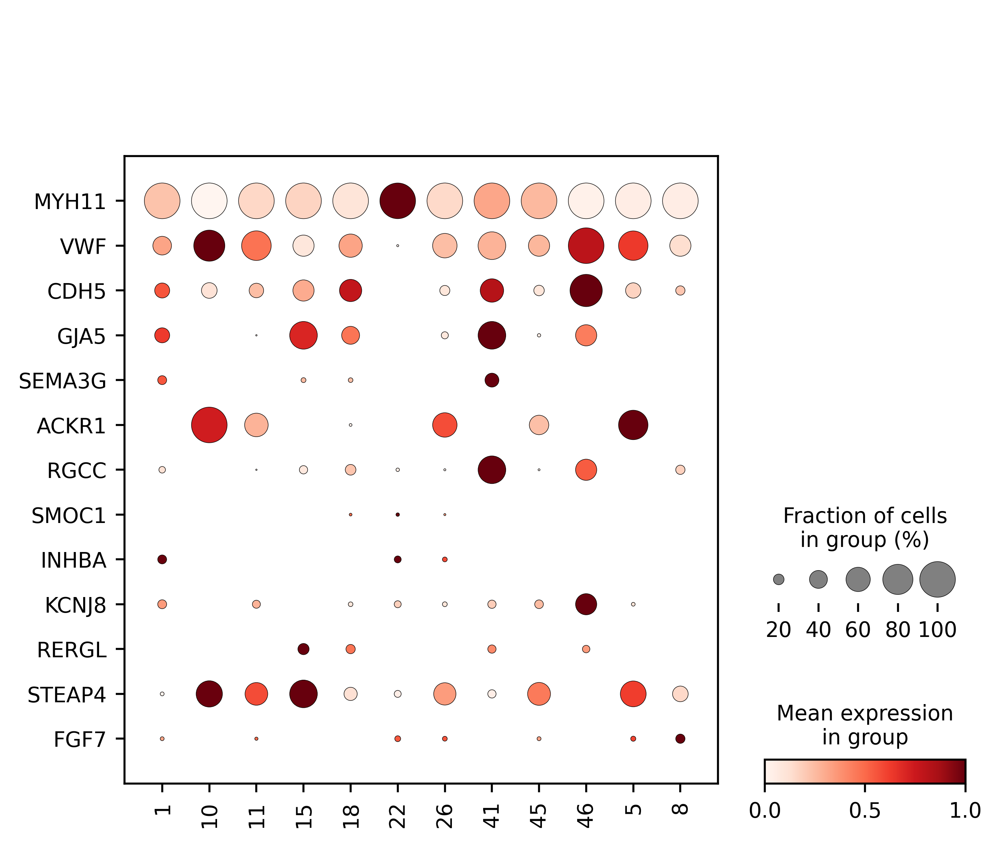

In [25]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [118]:
# add gene percentage expressed to dataframe

In [26]:
adata_aec_subset.obs['RERGL_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='RERGL'] > 0)

In [27]:
adata_aec_subset.obs['STEAP4_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 0)

In [28]:
adata_aec_subset.obs['FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [29]:
adata_aec_subset.obs['KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [30]:
adata_aec_subset.obs['AGT_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='AGT'] > 0)

In [31]:
adata_aec_subset.obs['STEAP4_FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [32]:
adata_aec_subset.obs['STEAP4_KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [33]:
adata_aec_subset

AnnData object with n_obs × n_vars = 382 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters', 'RERGL_percent', 'STEAP4_percent', 'FGF7_percent', 'KCNJ8_percent', 'AGT_percent', 'STEAP4_FGF7_percent', 'STEAP4_KCNJ8_percent'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [34]:
results = adata_aec_subset.obs[['RERGL_percent','STEAP4_percent','FGF7_percent','KCNJ8_percent','AGT_percent','STEAP4_FGF7_percent','STEAP4_KCNJ8_percent','SMC_clusters']].groupby('SMC_clusters').mean()

In [35]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent
SMC_clusters,,,,,,,
1,0.000000,0.052632,0.052632,0.157895,0.368421,0.000000,0.000000
10,0.000000,0.666667,0.000000,0.000000,0.333333,0.000000,0.000000
11,0.000000,0.547945,0.041096,0.136986,0.452055,0.013699,0.082192
15,0.214286,0.714286,0.000000,0.000000,0.500000,0.000000,0.000000
18,0.166667,0.266667,0.000000,0.066667,0.333333,0.000000,0.000000
22,0.000000,0.113636,0.090909,0.113636,0.045455,0.000000,0.000000
26,0.000000,0.534884,0.069767,0.069767,0.395349,0.046512,0.023256
41,0.142857,0.142857,0.000000,0.142857,0.714286,0.000000,0.000000
45,0.000000,0.554348,0.054348,0.152174,0.423913,0.021739,0.076087


In [36]:
matrix=pd.DataFrame(adata_aec_subset.X,columns=adata_aec_subset.raw.var.index,index=adata_aec_subset.obs.index)

In [37]:
matrix["SMC_clusters"] = adata_aec_subset.obs["SMC_clusters"]

In [38]:
matrix2 = matrix.replace(0, np.NaN)

In [39]:
df_mean_nonzero =matrix2.groupby("SMC_clusters").mean()

In [40]:
df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]

Genes,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,
1,NaN,1.000000,1.000000,1.571429,1.666667,1.0,NaN,2.0,NaN
10,NaN,5.000000,NaN,1.500000,NaN,NaN,5.000000,NaN,NaN
11,NaN,3.550000,2.000000,4.060606,1.500000,NaN,3.238095,1.0,NaN
15,1.666667,4.700000,NaN,1.428571,NaN,1.0,NaN,1.0,NaN
18,1.000000,1.500000,NaN,1.600000,1.000000,1.0,1.000000,2.0,1.0
22,NaN,1.200000,1.000000,1.000000,1.200000,NaN,NaN,1.5,1.5
26,NaN,2.173913,1.333333,3.176471,1.000000,NaN,6.461538,1.0,1.0
41,1.000000,1.000000,NaN,3.000000,1.000000,1.0,NaN,2.6,NaN
45,NaN,2.725490,1.000000,3.589744,1.214286,NaN,3.634146,1.0,NaN


### add expression values to dataframe

In [41]:
#mean expression (expressing bins only / cluster)
test = pd.concat([results, df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]], axis = 1)

In [42]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,,,,,,,,
1,0.000000,0.052632,0.052632,0.157895,0.368421,0.000000,0.000000,NaN,1.000000,1.000000,1.571429,1.666667,1.0,NaN,2.0,NaN
10,0.000000,0.666667,0.000000,0.000000,0.333333,0.000000,0.000000,NaN,5.000000,NaN,1.500000,NaN,NaN,5.000000,NaN,NaN
11,0.000000,0.547945,0.041096,0.136986,0.452055,0.013699,0.082192,NaN,3.550000,2.000000,4.060606,1.500000,NaN,3.238095,1.0,NaN
15,0.214286,0.714286,0.000000,0.000000,0.500000,0.000000,0.000000,1.666667,4.700000,NaN,1.428571,NaN,1.0,NaN,1.0,NaN
18,0.166667,0.266667,0.000000,0.066667,0.333333,0.000000,0.000000,1.000000,1.500000,NaN,1.600000,1.000000,1.0,1.000000,2.0,1.0
22,0.000000,0.113636,0.090909,0.113636,0.045455,0.000000,0.000000,NaN,1.200000,1.000000,1.000000,1.200000,NaN,NaN,1.5,1.5
26,0.000000,0.534884,0.069767,0.069767,0.395349,0.046512,0.023256,NaN,2.173913,1.333333,3.176471,1.000000,NaN,6.461538,1.0,1.0
41,0.142857,0.142857,0.000000,0.142857,0.714286,0.000000,0.000000,1.000000,1.000000,NaN,3.000000,1.000000,1.0,NaN,2.6,NaN
45,0.000000,0.554348,0.054348,0.152174,0.423913,0.021739,0.076087,NaN,2.725490,1.000000,3.589744,1.214286,NaN,3.634146,1.0,NaN


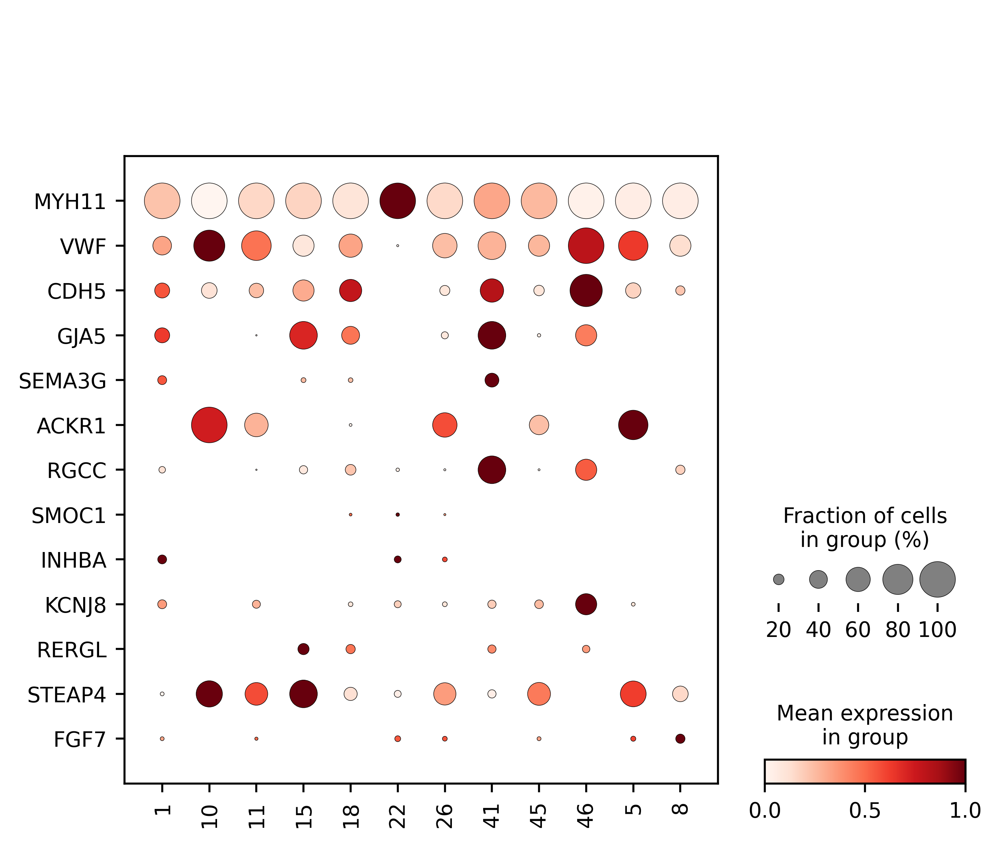

In [43]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [137]:
#add vessel type annotation column

In [45]:
test["Vessel"] = ['Artery','Vein','Vein','Artery','Artery','Unclear','Vein','Artery','Vein','Artery','Vein','Unclear']

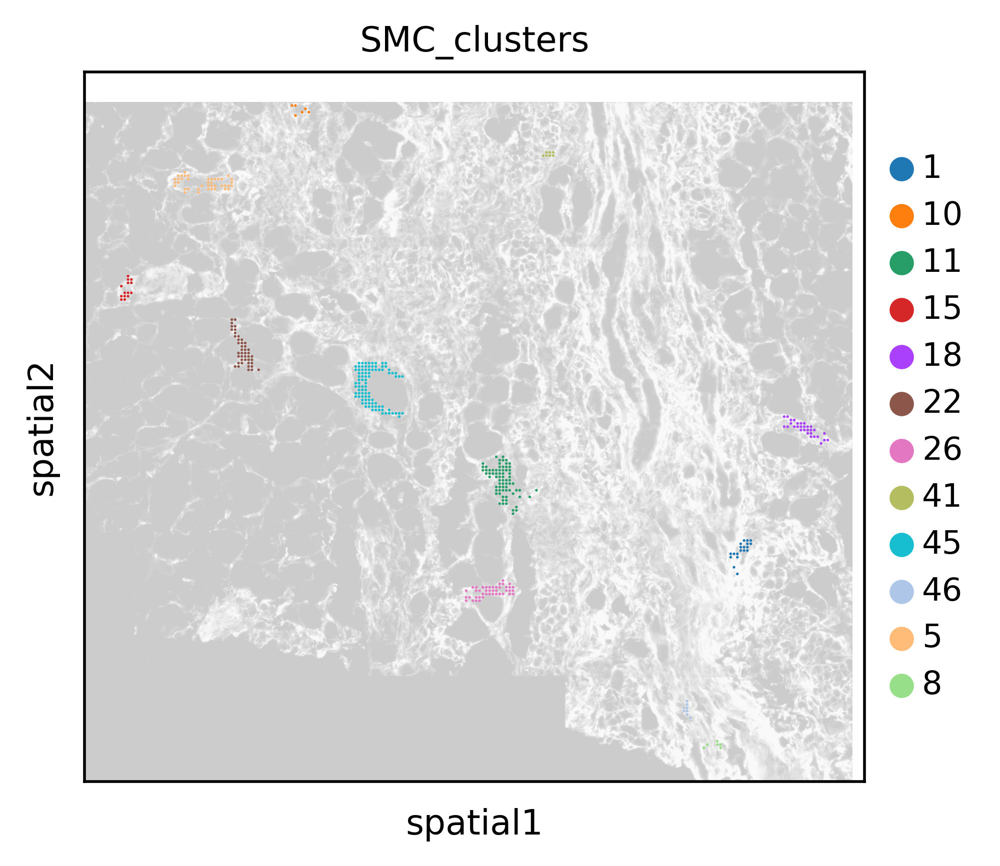

In [44]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

In [46]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel
SMC_clusters,,,,,,,,,,,,,,,,,
1,0.000000,0.052632,0.052632,0.157895,0.368421,0.000000,0.000000,NaN,1.000000,1.000000,1.571429,1.666667,1.0,NaN,2.0,NaN,Artery
10,0.000000,0.666667,0.000000,0.000000,0.333333,0.000000,0.000000,NaN,5.000000,NaN,1.500000,NaN,NaN,5.000000,NaN,NaN,Vein
11,0.000000,0.547945,0.041096,0.136986,0.452055,0.013699,0.082192,NaN,3.550000,2.000000,4.060606,1.500000,NaN,3.238095,1.0,NaN,Vein
15,0.214286,0.714286,0.000000,0.000000,0.500000,0.000000,0.000000,1.666667,4.700000,NaN,1.428571,NaN,1.0,NaN,1.0,NaN,Artery
18,0.166667,0.266667,0.000000,0.066667,0.333333,0.000000,0.000000,1.000000,1.500000,NaN,1.600000,1.000000,1.0,1.000000,2.0,1.0,Artery
22,0.000000,0.113636,0.090909,0.113636,0.045455,0.000000,0.000000,NaN,1.200000,1.000000,1.000000,1.200000,NaN,NaN,1.5,1.5,Unclear
26,0.000000,0.534884,0.069767,0.069767,0.395349,0.046512,0.023256,NaN,2.173913,1.333333,3.176471,1.000000,NaN,6.461538,1.0,1.0,Vein
41,0.142857,0.142857,0.000000,0.142857,0.714286,0.000000,0.000000,1.000000,1.000000,NaN,3.000000,1.000000,1.0,NaN,2.6,NaN,Artery
45,0.000000,0.554348,0.054348,0.152174,0.423913,0.021739,0.076087,NaN,2.725490,1.000000,3.589744,1.214286,NaN,3.634146,1.0,NaN,Vein


### add vessel size numbers

In [47]:
adata_aec_subset.obs.SMC_clusters.value_counts()

45    92
11    73
22    44
26    43
5     40
18    30
1     19
15    14
46     8
41     7
10     6
8      6
Name: SMC_clusters, dtype: int64

In [48]:
results = test.join(adata_aec_subset.obs['SMC_clusters'].value_counts(), on=None, how='left', lsuffix='', rsuffix='', sort=False, validate=None)

In [49]:
results.columns = list(results.columns[0:17]) + ['size']

In [50]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size
SMC_clusters,,,,,,,,,,,,,,,,,,
1,0.000000,0.052632,0.052632,0.157895,0.368421,0.000000,0.000000,NaN,1.000000,1.000000,1.571429,1.666667,1.0,NaN,2.0,NaN,Artery,19
10,0.000000,0.666667,0.000000,0.000000,0.333333,0.000000,0.000000,NaN,5.000000,NaN,1.500000,NaN,NaN,5.000000,NaN,NaN,Vein,6
11,0.000000,0.547945,0.041096,0.136986,0.452055,0.013699,0.082192,NaN,3.550000,2.000000,4.060606,1.500000,NaN,3.238095,1.0,NaN,Vein,73
15,0.214286,0.714286,0.000000,0.000000,0.500000,0.000000,0.000000,1.666667,4.700000,NaN,1.428571,NaN,1.0,NaN,1.0,NaN,Artery,14
18,0.166667,0.266667,0.000000,0.066667,0.333333,0.000000,0.000000,1.000000,1.500000,NaN,1.600000,1.000000,1.0,1.000000,2.0,1.0,Artery,30
22,0.000000,0.113636,0.090909,0.113636,0.045455,0.000000,0.000000,NaN,1.200000,1.000000,1.000000,1.200000,NaN,NaN,1.5,1.5,Unclear,44
26,0.000000,0.534884,0.069767,0.069767,0.395349,0.046512,0.023256,NaN,2.173913,1.333333,3.176471,1.000000,NaN,6.461538,1.0,1.0,Vein,43
41,0.142857,0.142857,0.000000,0.142857,0.714286,0.000000,0.000000,1.000000,1.000000,NaN,3.000000,1.000000,1.0,NaN,2.6,NaN,Artery,7
45,0.000000,0.554348,0.054348,0.152174,0.423913,0.021739,0.076087,NaN,2.725490,1.000000,3.589744,1.214286,NaN,3.634146,1.0,NaN,Vein,92


In [51]:
group=pd.Series("Large", index=results.index)

In [52]:
group[results["size"] <= 30] = "Small"

In [53]:
group

SMC_clusters
1     Small
10    Small
11    Large
15    Small
18    Small
22    Large
26    Large
41    Small
45    Large
46    Small
5     Large
8     Small
dtype: object

In [54]:
results["group"] = group

In [55]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group
SMC_clusters,,,,,,,,,,,,,,,,,,,
1,0.000000,0.052632,0.052632,0.157895,0.368421,0.000000,0.000000,NaN,1.000000,1.000000,1.571429,1.666667,1.0,NaN,2.0,NaN,Artery,19,Small
10,0.000000,0.666667,0.000000,0.000000,0.333333,0.000000,0.000000,NaN,5.000000,NaN,1.500000,NaN,NaN,5.000000,NaN,NaN,Vein,6,Small
11,0.000000,0.547945,0.041096,0.136986,0.452055,0.013699,0.082192,NaN,3.550000,2.000000,4.060606,1.500000,NaN,3.238095,1.0,NaN,Vein,73,Large
15,0.214286,0.714286,0.000000,0.000000,0.500000,0.000000,0.000000,1.666667,4.700000,NaN,1.428571,NaN,1.0,NaN,1.0,NaN,Artery,14,Small
18,0.166667,0.266667,0.000000,0.066667,0.333333,0.000000,0.000000,1.000000,1.500000,NaN,1.600000,1.000000,1.0,1.000000,2.0,1.0,Artery,30,Small
22,0.000000,0.113636,0.090909,0.113636,0.045455,0.000000,0.000000,NaN,1.200000,1.000000,1.000000,1.200000,NaN,NaN,1.5,1.5,Unclear,44,Large
26,0.000000,0.534884,0.069767,0.069767,0.395349,0.046512,0.023256,NaN,2.173913,1.333333,3.176471,1.000000,NaN,6.461538,1.0,1.0,Vein,43,Large
41,0.142857,0.142857,0.000000,0.142857,0.714286,0.000000,0.000000,1.000000,1.000000,NaN,3.000000,1.000000,1.0,NaN,2.6,NaN,Artery,7,Small
45,0.000000,0.554348,0.054348,0.152174,0.423913,0.021739,0.076087,NaN,2.725490,1.000000,3.589744,1.214286,NaN,3.634146,1.0,NaN,Vein,92,Large


In [58]:
results["vessel_size"] = results["Vessel"] + "_" + results["group"]

In [59]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size
SMC_clusters,,,,,,,,,,,,,,,,,,,,
1,0.000000,0.052632,0.052632,0.157895,0.368421,0.000000,0.000000,NaN,1.000000,1.000000,1.571429,1.666667,1.0,NaN,2.0,NaN,Artery,19,Small,Artery_Small
10,0.000000,0.666667,0.000000,0.000000,0.333333,0.000000,0.000000,NaN,5.000000,NaN,1.500000,NaN,NaN,5.000000,NaN,NaN,Vein,6,Small,Vein_Small
11,0.000000,0.547945,0.041096,0.136986,0.452055,0.013699,0.082192,NaN,3.550000,2.000000,4.060606,1.500000,NaN,3.238095,1.0,NaN,Vein,73,Large,Vein_Large
15,0.214286,0.714286,0.000000,0.000000,0.500000,0.000000,0.000000,1.666667,4.700000,NaN,1.428571,NaN,1.0,NaN,1.0,NaN,Artery,14,Small,Artery_Small
18,0.166667,0.266667,0.000000,0.066667,0.333333,0.000000,0.000000,1.000000,1.500000,NaN,1.600000,1.000000,1.0,1.000000,2.0,1.0,Artery,30,Small,Artery_Small
22,0.000000,0.113636,0.090909,0.113636,0.045455,0.000000,0.000000,NaN,1.200000,1.000000,1.000000,1.200000,NaN,NaN,1.5,1.5,Unclear,44,Large,Unclear_Large
26,0.000000,0.534884,0.069767,0.069767,0.395349,0.046512,0.023256,NaN,2.173913,1.333333,3.176471,1.000000,NaN,6.461538,1.0,1.0,Vein,43,Large,Vein_Large
41,0.142857,0.142857,0.000000,0.142857,0.714286,0.000000,0.000000,1.000000,1.000000,NaN,3.000000,1.000000,1.0,NaN,2.6,NaN,Artery,7,Small,Artery_Small
45,0.000000,0.554348,0.054348,0.152174,0.423913,0.021739,0.076087,NaN,2.725490,1.000000,3.589744,1.214286,NaN,3.634146,1.0,NaN,Vein,92,Large,Vein_Large


In [72]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### add ROI numbers

In [60]:
results.index = ['ROI_D2-2_' + str(i) for i in test.index.tolist()]

In [61]:
results["ROI"] = "D2-2"

In [73]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size,ROI
ROI_D2-2_1,0.000000,0.052632,0.052632,0.157895,0.368421,0.000000,0.000000,NaN,1.000000,1.000000,1.571429,1.666667,1.0,NaN,2.0,NaN,Artery,19,Small,Artery_Small,D2-2
ROI_D2-2_10,0.000000,0.666667,0.000000,0.000000,0.333333,0.000000,0.000000,NaN,5.000000,NaN,1.500000,NaN,NaN,5.000000,NaN,NaN,Vein,6,Small,Vein_Small,D2-2
ROI_D2-2_11,0.000000,0.547945,0.041096,0.136986,0.452055,0.013699,0.082192,NaN,3.550000,2.000000,4.060606,1.500000,NaN,3.238095,1.0,NaN,Vein,73,Large,Vein_Large,D2-2
ROI_D2-2_15,0.214286,0.714286,0.000000,0.000000,0.500000,0.000000,0.000000,1.666667,4.700000,NaN,1.428571,NaN,1.0,NaN,1.0,NaN,Artery,14,Small,Artery_Small,D2-2
ROI_D2-2_18,0.166667,0.266667,0.000000,0.066667,0.333333,0.000000,0.000000,1.000000,1.500000,NaN,1.600000,1.000000,1.0,1.000000,2.0,1.0,Artery,30,Small,Artery_Small,D2-2
ROI_D2-2_22,0.000000,0.113636,0.090909,0.113636,0.045455,0.000000,0.000000,NaN,1.200000,1.000000,1.000000,1.200000,NaN,NaN,1.5,1.5,Unclear,44,Large,Unclear_Large,D2-2
ROI_D2-2_26,0.000000,0.534884,0.069767,0.069767,0.395349,0.046512,0.023256,NaN,2.173913,1.333333,3.176471,1.000000,NaN,6.461538,1.0,1.0,Vein,43,Large,Vein_Large,D2-2
ROI_D2-2_41,0.142857,0.142857,0.000000,0.142857,0.714286,0.000000,0.000000,1.000000,1.000000,NaN,3.000000,1.000000,1.0,NaN,2.6,NaN,Artery,7,Small,Artery_Small,D2-2
ROI_D2-2_45,0.000000,0.554348,0.054348,0.152174,0.423913,0.021739,0.076087,NaN,2.725490,1.000000,3.589744,1.214286,NaN,3.634146,1.0,NaN,Vein,92,Large,Vein_Large,D2-2
ROI_D2-2_46,0.125000,0.000000,0.000000,0.500000,0.625000,0.000000,0.000000,1.000000,NaN,NaN,3.800000,1.500000,NaN,NaN,2.0,NaN,Artery,8,Small,Artery_Small,D2-2


[Text(0.5, 1.0, 'RERGL percentage expression')]

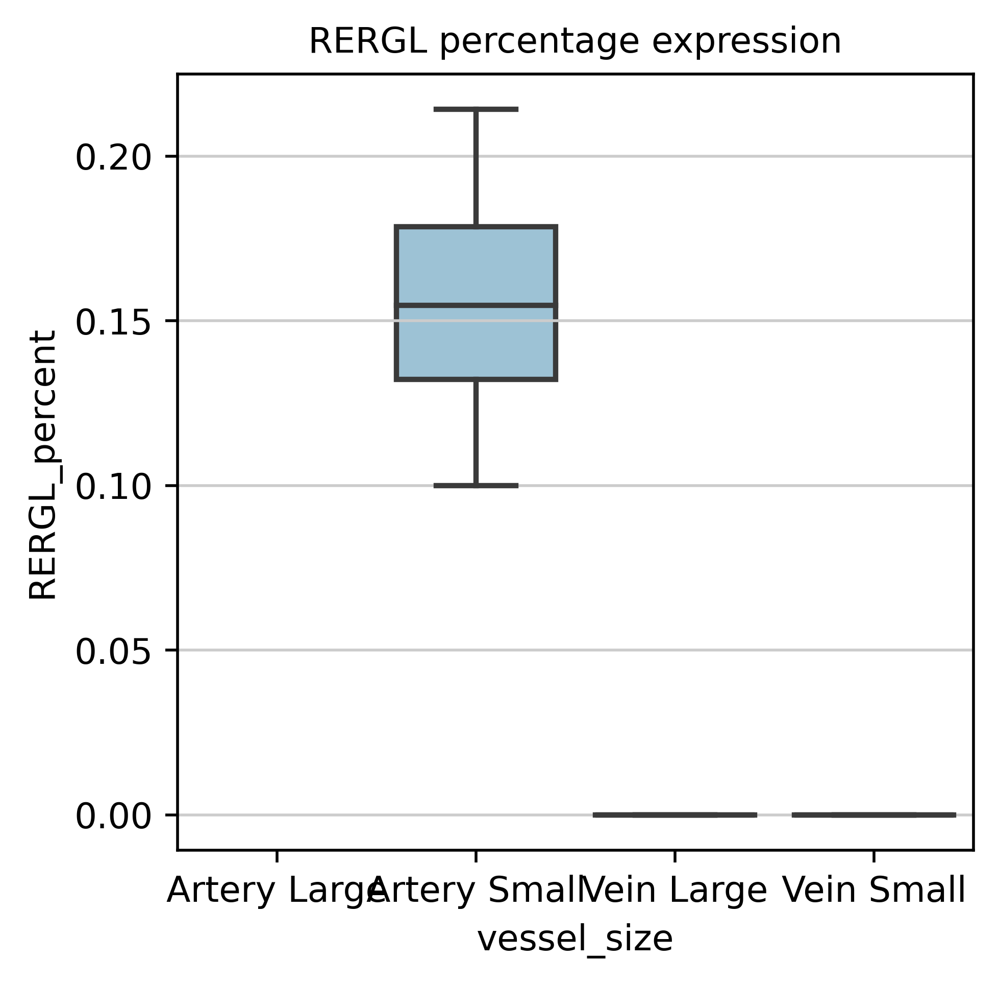

In [154]:
sns.boxplot(data = results, x = "vessel_size", y = "RERGL_percent", palette = 'Blues', order = ['Artery Large','Artery Small','Vein Large','Vein Small']).set(title='RERGL percentage expression')

[Text(0.5, 1.0, 'RERGL mean expression')]

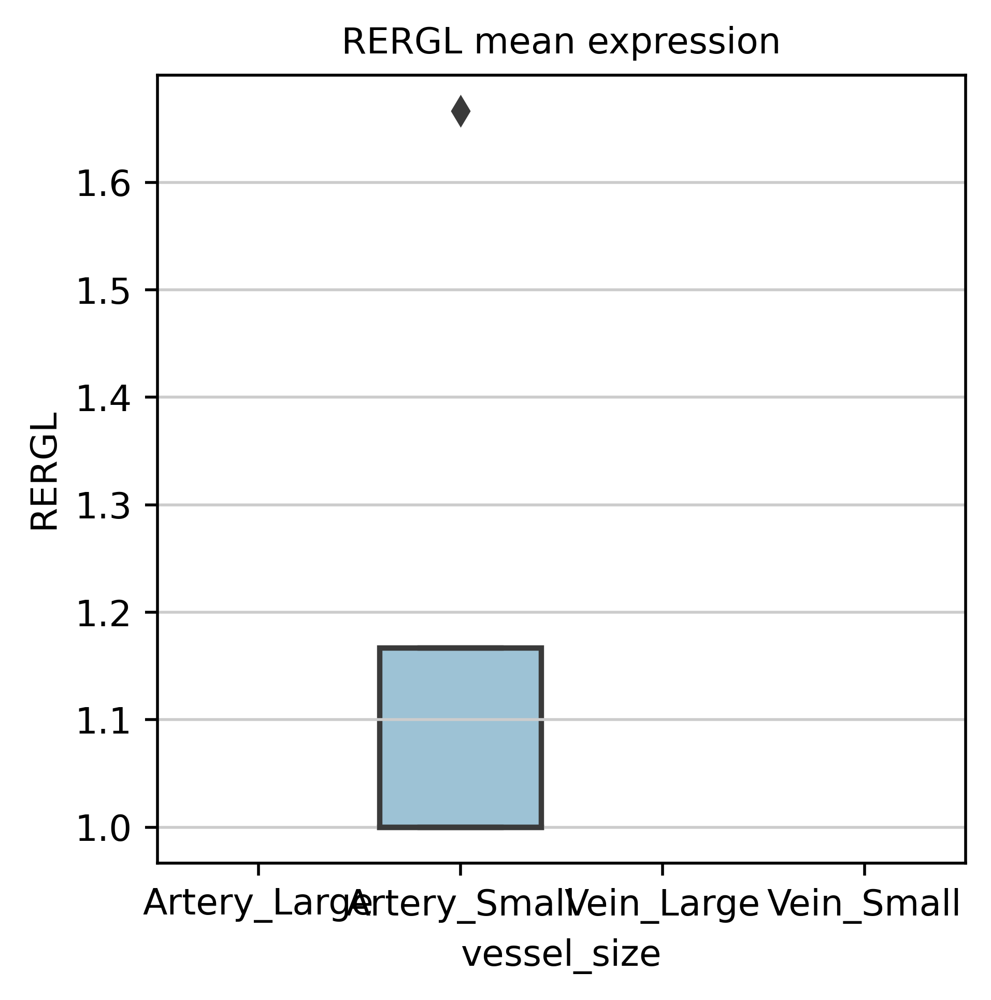

In [73]:
sns.boxplot(data = results, x = "vessel_size", y = "RERGL", palette = 'Blues', order = ['Artery_Large','Artery_Small','Vein_Large','Vein_Small']).set(title='RERGL mean expression')

[Text(0.5, 1.0, 'STEAP4 percentage expression')]

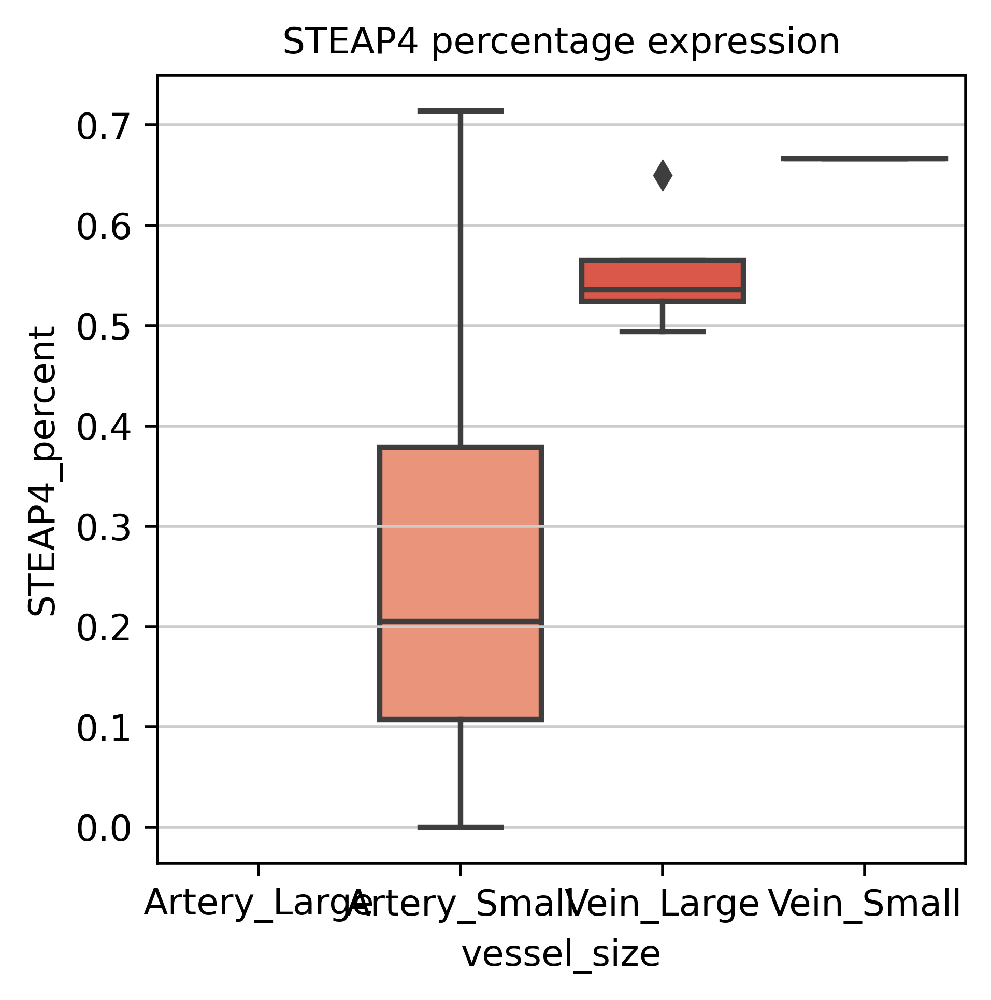

In [92]:
sns.boxplot(data = results, x = "vessel_size", y = "STEAP4_percent", palette = 'Reds', order = ['Artery_Large','Artery_Small','Vein_Large','Vein_Small']).set(title='STEAP4 percentage expression')

[Text(0.5, 1.0, 'STEAP4 mean expression')]

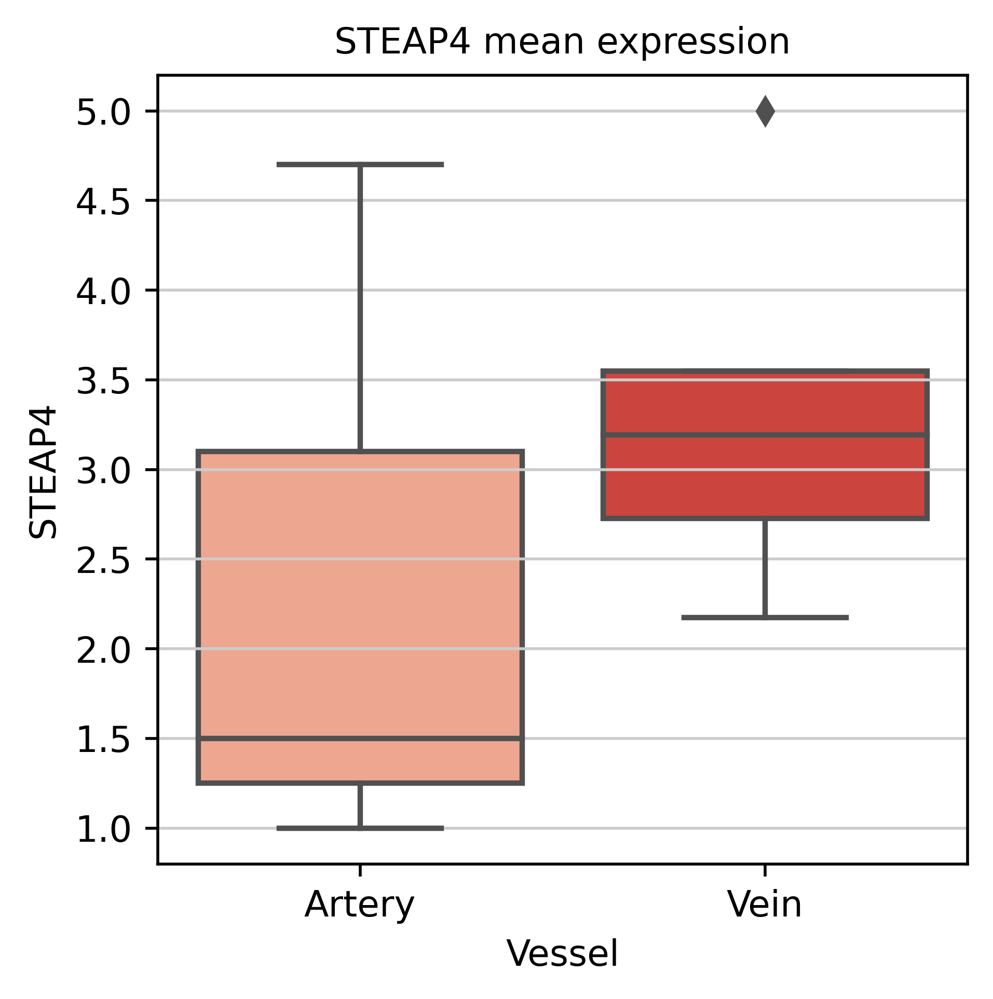

In [54]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 mean expression')

In [55]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,ROI
ROI_D2-2_1,0.000000,0.111111,0.088889,0.111111,0.044444,0.000000,0.000000,NaN,1.200000,1.000000,1.000000,1.200000,NaN,NaN,1.5,1.5,Unclear,D2-2
ROI_D2-2_12,0.000000,0.650000,0.075000,0.050000,0.250000,0.025000,0.050000,NaN,3.192308,1.333333,1.800000,1.500000,NaN,8.774194,NaN,NaN,Vein,D2-2
ROI_D2-2_15,0.214286,0.714286,0.000000,0.000000,0.500000,0.000000,0.000000,1.666667,4.700000,NaN,1.428571,NaN,1.0,NaN,1.0,NaN,Artery,D2-2
ROI_D2-2_17,0.000000,0.333333,0.166667,0.000000,0.500000,0.000000,0.000000,NaN,1.500000,1.000000,2.333333,NaN,NaN,NaN,2.0,NaN,Unclear,D2-2
ROI_D2-2_2,0.000000,0.050000,0.050000,0.150000,0.350000,0.000000,0.000000,NaN,1.000000,1.000000,1.571429,1.666667,1.0,NaN,2.0,NaN,Unclear,D2-2
ROI_D2-2_21,0.000000,0.666667,0.000000,0.000000,0.333333,0.000000,0.000000,NaN,5.000000,NaN,1.500000,NaN,NaN,5.000000,NaN,NaN,Vein,D2-2
ROI_D2-2_26,0.000000,0.534884,0.069767,0.069767,0.395349,0.046512,0.023256,NaN,2.173913,1.333333,3.176471,1.000000,NaN,6.461538,1.0,1.0,Vein,D2-2
ROI_D2-2_3,0.000000,0.493827,0.037037,0.123457,0.419753,0.012346,0.074074,NaN,3.550000,2.000000,4.029412,1.500000,NaN,3.238095,1.0,NaN,Vein,D2-2
ROI_D2-2_38,0.166667,0.266667,0.000000,0.066667,0.333333,0.000000,0.000000,1.000000,1.500000,NaN,1.600000,1.000000,1.0,1.000000,2.0,1.0,Artery,D2-2
ROI_D2-2_4,0.000000,0.536842,0.052632,0.147368,0.410526,0.021053,0.073684,NaN,2.725490,1.000000,3.589744,1.214286,NaN,3.571429,1.0,NaN,Vein,D2-2
